# Hyperparameter Optimization for VT Using Calendar Feature Stage

This notebook trains a VT (Vanilla Transformer) model for day-ahead electricity price forecasting using a 1-week input window and the calendar feature stage, which includes date-based variables such as day of the week, month, holidays, and cyclic time encodings.

Before training, **hyperparameter optimization is performed** to identify the best model configuration. The model is evaluated across multiple hyperparameter settings, and the best-performing configuration is selected for final evaluation.

The best model's configuration is saved externally as a JSON file in the **"best" folder** to ensure exact reproducibility for future experiments, including transfer learning.

Performance is evaluated using standard error metrics, and visualizations are generated to analyze forecast accuracy.

In [1]:
import pandas as pd

# Load data
train_df = pd.read_csv('~/data/Germany_time_zone/gas/train_with_gas.csv')
test_df = pd.read_csv('~/data/Germany_time_zone/gas/test_with_gas.csv')

# Convert to UTC while handling DST ambiguities
train_df['ds'] = pd.to_datetime(train_df['ds']).dt.tz_localize('Europe/Berlin', ambiguous='infer').dt.tz_convert('UTC')
test_df['ds'] = pd.to_datetime(test_df['ds']).dt.tz_localize('Europe/Berlin', ambiguous='infer').dt.tz_convert('UTC')

# Check date ranges
print("First date in train_df:", train_df['ds'].min())
print("Last date in train_df:", train_df['ds'].max())
print("First date in test_df:", test_df['ds'].min())
print("Last date in test_df:", test_df['ds'].max())

# Define the exogenous variable lists
futr_exog_list = ['month_sin', 'month_cos', 'day_of_week_sin', 'day_of_week_cos',
                  'hour_sin', 'hour_cos', 'is_holiday', 'is_weekend']

First date in train_df: 2018-09-30 22:00:00+00:00
Last date in train_df: 2023-12-31 22:00:00+00:00
First date in test_df: 2023-12-31 23:00:00+00:00
Last date in test_df: 2024-12-31 22:00:00+00:00


Train and optimise the hyperparameters

In [ ]:
from neuralforecast import NeuralForecast
from neuralforecast.auto import AutoVanillaTransformer
import optuna

horizon = 24
historical = 24 * 7
validation_size = int(0.1 * len(train_df))
# validation_size = 24 * 30 * 3 # 3 months 

number_of_samples = 10
model_name = 'AutoVanillaTransformer'


def config(trial):
    h = horizon
    return {
        "futr_exog_list": trial.suggest_categorical("futr_exog_list", [futr_exog_list]),
        "input_size": trial.suggest_categorical(
            "input_size",
            # [x * 24 for x in [1, 3, 4, 7, 10, 14]]
            [historical]
        ),
        "max_steps": trial.suggest_int("max_steps", 1000, 10000, step=1000),  # Maximum steps (quantized by 1000)
        "step_size": trial.suggest_categorical("step_size",
                                               [1, h]
                                               # [h]
                                               ),
        "learning_rate": trial.suggest_loguniform("learning_rate", 1e-4, 1e-1),  # Learning rate (log-uniform)
        "scaler_type": trial.suggest_categorical("scaler_type", [None, "robust", "standard"]),  # Scaler type
        "batch_size": trial.suggest_categorical("batch_size", [8, 16, 32, 64, 128, 256]),  # Batch size
        "windows_batch_size": trial.suggest_categorical("windows_batch_size", [8, 16, 32, 64, 128, 256]),  # Windows batch size
        "random_seed": trial.suggest_int("random_seed", 1, 20),  # Random seed

        "hidden_size": trial.suggest_categorical("hidden_size", [32,64, 128, 256]),
        "n_head": trial.suggest_categorical("n_head", [4, 8, 
                                                       16,32,
                                                      ]),
        
        "conv_hidden_size": trial.suggest_categorical("conv_hidden_size", [8, 16, 32, 64, 128]),
        "encoder_layers": trial.suggest_int("encoder_layers", 1, 10),
        "decoder_layers": trial.suggest_int("decoder_layers", 1, 10),
    }
    
model = AutoVanillaTransformer(h=horizon,
                  config=config,
                  search_alg=optuna.samplers.TPESampler(),
                  backend='optuna',
                  num_samples=number_of_samples,
                 )


# Train the model on the entire training data just once
nf = NeuralForecast(models=[model], freq='h')
nf.fit(df=train_df, val_size=validation_size) 

In [3]:
results = nf.models[0].results.trials_dataframe()
results.drop(columns='user_attrs_ALL_PARAMS')

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_conv_hidden_size,params_decoder_layers,params_encoder_layers,params_futr_exog_list,...,params_input_size,params_learning_rate,params_max_steps,params_n_head,params_random_seed,params_scaler_type,params_step_size,params_windows_batch_size,user_attrs_METRICS,state
0,0,43.715393,2025-03-07 10:46:39.961352,2025-03-07 10:50:07.216616,0 days 00:03:27.255264,16,8,2,2,"[month_sin, month_cos, day_of_week_sin, day_of...",...,168,0.000908,3000,4,9,None,1,128,"{'loss': tensor(43.7154), 'train_loss': tensor...",COMPLETE
1,1,28.617821,2025-03-07 10:50:07.218170,2025-03-07 10:53:28.404780,0 days 00:03:21.186610,8,64,5,9,"[month_sin, month_cos, day_of_week_sin, day_of...",...,168,0.000530,3000,32,19,standard,24,8,"{'loss': tensor(28.6178), 'train_loss': tensor...",COMPLETE
2,2,22.699989,2025-03-07 10:53:28.406492,2025-03-07 11:13:11.987965,0 days 00:19:43.581473,8,8,6,6,"[month_sin, month_cos, day_of_week_sin, day_of...",...,168,0.000198,7000,32,6,robust,1,64,"{'loss': tensor(22.7000), 'train_loss': tensor...",COMPLETE
3,3,26.719627,2025-03-07 11:13:11.989575,2025-03-07 11:19:03.576786,0 days 00:05:51.587211,16,32,4,5,"[month_sin, month_cos, day_of_week_sin, day_of...",...,168,0.000403,7000,8,2,standard,24,8,"{'loss': tensor(26.7196), 'train_loss': tensor...",COMPLETE
4,4,48.983845,2025-03-07 11:19:03.578653,2025-03-07 11:29:14.432072,0 days 00:10:10.853419,16,16,9,10,"[month_sin, month_cos, day_of_week_sin, day_of...",...,168,0.000346,7000,16,1,None,24,16,"{'loss': tensor(48.9838), 'train_loss': tensor...",COMPLETE
5,5,52.078098,2025-03-07 11:29:14.433861,2025-03-07 11:35:16.164607,0 days 00:06:01.730746,32,32,5,3,"[month_sin, month_cos, day_of_week_sin, day_of...",...,168,0.015839,3000,32,9,None,24,64,"{'loss': tensor(52.0781), 'train_loss': tensor...",COMPLETE
6,6,47.456726,2025-03-07 11:35:16.166388,2025-03-07 12:14:42.882124,0 days 00:39:26.715736,256,16,10,10,"[month_sin, month_cos, day_of_week_sin, day_of...",...,168,0.019802,8000,4,10,None,1,256,"{'loss': tensor(47.4567), 'train_loss': tensor...",COMPLETE
7,7,31.165447,2025-03-07 12:14:42.883714,2025-03-07 12:18:53.114731,0 days 00:04:10.231017,32,16,6,1,"[month_sin, month_cos, day_of_week_sin, day_of...",...,168,0.061278,5000,4,18,robust,24,8,"{'loss': tensor(31.1654), 'train_loss': tensor...",COMPLETE
8,8,42.884235,2025-03-07 12:18:53.116396,2025-03-07 12:31:43.436340,0 days 00:12:50.319944,16,8,7,9,"[month_sin, month_cos, day_of_week_sin, day_of...",...,168,0.000254,10000,4,5,None,24,32,"{'loss': tensor(42.8842), 'train_loss': tensor...",COMPLETE
9,9,32.612339,2025-03-07 12:31:43.438064,2025-03-07 12:33:07.007939,0 days 00:01:23.569875,64,128,10,4,"[month_sin, month_cos, day_of_week_sin, day_of...",...,168,0.044823,1000,16,1,standard,24,16,"{'loss': tensor(32.6123), 'train_loss': tensor...",COMPLETE


In [4]:
nf.models[0].results.best_trial.user_attrs["ALL_PARAMS"]

{'futr_exog_list': ['month_sin',
  'month_cos',
  'day_of_week_sin',
  'day_of_week_cos',
  'hour_sin',
  'hour_cos',
  'is_holiday',
  'is_weekend'],
 'input_size': 168,
 'max_steps': 7000,
 'step_size': 1,
 'learning_rate': 0.00019823660435163549,
 'scaler_type': 'robust',
 'batch_size': 8,
 'windows_batch_size': 64,
 'random_seed': 6,
 'hidden_size': 64,
 'n_head': 32,
 'conv_hidden_size': 8,
 'encoder_layers': 6,
 'decoder_layers': 6,
 'h': 24,
 'loss': MAE(),
 'valid_loss': MAE()}

In [5]:
# Optuna
best_config = nf.models[0].results.best_trial.user_attrs["ALL_PARAMS"]

historical = best_config["input_size"]
print(historical)

168


In [6]:
import json

# Let's say you have your best params dictionary
best_params = nf.models[0].results.best_trial.user_attrs["ALL_PARAMS"]

# Remove non-serializable keys (e.g., the loss objects)
best_params.pop('loss', None)
best_params.pop('valid_loss', None)

# Save it to a JSON file
with open("../best/best_config.json", "w") as f:
    json.dump(best_params, f, indent=4)

In [7]:
print('done with hyperparameter optimisation')

done with hyperparameter optimisation


Test the model

In [ ]:
# Define the date range based on the test dataset
daterange = pd.date_range(
    start=test_df['ds'].min() + pd.Timedelta(hours=historical),  # Ensure enough historical data is available
    end=test_df['ds'].max() - pd.Timedelta(hours=horizon),       # Leave enough room for horizon predictions
    freq='24H'
)

# Generate predictions for each 24-hour window
predictions = [
    nf.predict(
        df=test_df[(test_df['ds'] >= d - pd.Timedelta(hours=historical)) & (test_df['ds'] < d)],
        futr_df=test_df[(test_df['ds'] >= d) & (test_df['ds'] < d + pd.Timedelta(hours=horizon))]
    )
    for d in daterange
]


# Flatten the predictions into a DataFrame
forecast_df = pd.concat(predictions, ignore_index=True)

# Ensure the results align with the test dataset
forecast_df = forecast_df[['ds', model_name ]].merge(test_df[['ds', 'y']], on='ds', how='inner')
forecast_df.rename(columns={'y': 'y_actual', model_name: 'y_pred'}, inplace=True)


In [9]:
forecast_df.head()

,ds,y_pred,y_actual
0,2024-01-07 23:00:00+00:00,84.790443,87.02
1,2024-01-08 00:00:00+00:00,81.349129,84.32
2,2024-01-08 01:00:00+00:00,79.796844,81.82
3,2024-01-08 02:00:00+00:00,78.929268,79.11
4,2024-01-08 03:00:00+00:00,78.928726,78.48


In [10]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Calculate error metrics
mae = mean_absolute_error(forecast_df['y_actual'], forecast_df['y_pred'])
mse = mean_squared_error(forecast_df['y_actual'], forecast_df['y_pred'])
rmse = np.sqrt(mse)

# Print the results
print("Model Performance:")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")

Model Performance:
Mean Absolute Error (MAE): 22.17
Mean Squared Error (MSE): 1385.17
Root Mean Squared Error (RMSE): 37.22


In [11]:
# Merge forecasted values with actual test data, selecting only the relevant columns
comparison_df = forecast_df[['ds', 'y_pred']].merge(test_df[['ds', 'y']], on='ds', how='inner')
comparison_df.rename(columns={'y': 'y_actual', 'y_pred': 'y_pred'}, inplace=True)

# Add a column for the day of the week (0=Monday, 1=Tuesday, ..., 6=Sunday)
comparison_df['day_of_week'] = comparison_df['ds'].dt.dayofweek

# Calculate and display MAE, MSE, and RMSE for each day of the week
metrics_by_day = {}

for day in range(7):
    # Filter data for each day of the week
    day_data = comparison_df[comparison_df['day_of_week'] == day]

    # Calculate the metrics for this day
    mae = mean_absolute_error(day_data['y_actual'], day_data['y_pred'])
    mse = mean_squared_error(day_data['y_actual'], day_data['y_pred'])
    rmse = np.sqrt(mse)

    # Store the metrics for each day
    metrics_by_day[day] = {
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse
    }
    

# Optionally, you can store these results in a DataFrame for easy viewing or further analysis
metrics_df = pd.DataFrame(metrics_by_day).T
print("\nMetrics by Day of the Week:")
print(metrics_df)


Metrics by Day of the Week:
         MAE          MSE       RMSE
0  21.155964  1002.189313  31.657374
1  23.343416  1458.415713  38.189209
2  23.067128  2027.301582  45.025566
3  26.651224  2694.250774  51.906173
4  18.472015   635.703585  25.213163
5  19.780417   714.444370  26.729092
6  22.763470  1171.275098  34.223897


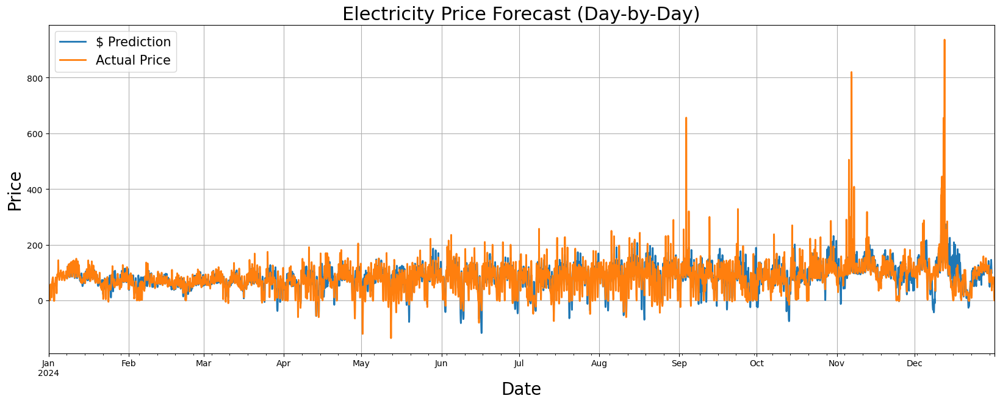

In [12]:
import matplotlib.pyplot as plt

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(20, 7))

# Plot predictions for model
forecast_df.set_index('ds')['y_pred'].plot(ax=ax, linewidth=2, label= f'$ Prediction')

# Optional: Plot actual test values for comparison
test_df.set_index('ds')['y'].plot(ax=ax, linewidth=2, label='Actual Price')

# Formatting the plot
ax.set_title('Electricity Price Forecast (Day-by-Day)', fontsize=22)
ax.set_ylabel('Price', fontsize=20)
ax.set_xlabel('Date', fontsize=20)
ax.legend(prop={'size': 15})
ax.grid()
plt.show()

In [13]:
overall_mean = test_df['y'].mean()

# Print the overall mean
print(f"Overall Mean Price: {overall_mean}")

Overall Mean Price: 78.51203324225867


/scratch/slurm_tmpdir/job_25363861/ipykernel_880987/644738538.py:9: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  unique_months = forecast_df['ds'].dt.to_period('M').unique()
/scratch/slurm_tmpdir/job_25363861/ipykernel_880987/644738538.py:20: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  forecast_month = forecast_df[forecast_df['ds'].dt.to_period('M') == month]
/scratch/slurm_tmpdir/job_25363861/ipykernel_880987/644738538.py:21: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  test_month = test_df[test_df['ds'].dt.to_period('M') == month]


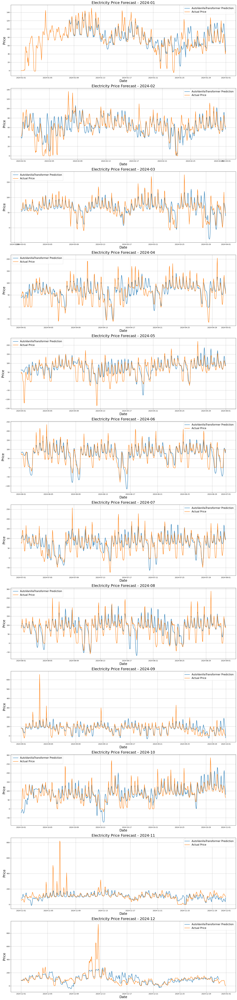

In [14]:
import matplotlib.pyplot as plt
import pandas as pd

# Ensure 'ds' is in datetime format
forecast_df['ds'] = pd.to_datetime(forecast_df['ds'])
test_df['ds'] = pd.to_datetime(test_df['ds'])

# Create a new figure with multiple subplots, one for each month
unique_months = forecast_df['ds'].dt.to_period('M').unique()

# Set up the figure and axes for plotting
fig, axes = plt.subplots(len(unique_months), 1, figsize=(20, 7 * len(unique_months)))

if len(unique_months) == 1:
    axes = [axes]  # Ensure axes is iterable even if there's only one subplot

for i, month in enumerate(unique_months):
    # Create the data subset for the current month
    month_str = str(month)
    forecast_month = forecast_df[forecast_df['ds'].dt.to_period('M') == month]
    test_month = test_df[test_df['ds'].dt.to_period('M') == month]

    # Plot predictions for the current month
    axes[i].plot(forecast_month['ds'], forecast_month['y_pred'], linewidth=2, label=f'{model_name} Prediction')

    # Plot actual test values for comparison in the current month
    axes[i].plot(test_month['ds'], test_month['y'], linewidth=2, label='Actual Price')

    # Formatting the plot for the current month
    axes[i].set_title(f'Electricity Price Forecast - {month_str}', fontsize=22)
    axes[i].set_ylabel('Price', fontsize=20)
    axes[i].set_xlabel('Date', fontsize=20)
    axes[i].legend(prop={'size': 15})
    axes[i].grid()

# Show the plot
plt.tight_layout()
plt.show()

In [15]:
import matplotlib.pyplot as plt
import pandas as pd

# Ensure 'ds' is in datetime format
forecast_df['ds'] = pd.to_datetime(forecast_df['ds'])
test_df['ds'] = pd.to_datetime(test_df['ds'])

# Create a new figure with multiple subplots, one for each biweekly period
# Group the data by biweekly periods
forecast_df['biweek'] = forecast_df['ds'].dt.to_period('2W')
test_df['biweek'] = test_df['ds'].dt.to_period('2W')

# Get the unique biweekly periods
unique_biweeks = forecast_df['biweek'].unique()

# Set up the figure and axes for plotting
fig, axes = plt.subplots(len(unique_biweeks), 1, figsize=(20, 7 * len(unique_biweeks)))

if len(unique_biweeks) == 1:
    axes = [axes]  # Ensure axes is iterable even if there's only one subplot

for i, biweek in enumerate(unique_biweeks):
    # Create the data subset for the current biweekly period
    biweek_str = str(biweek)
    forecast_biweek = forecast_df[forecast_df['biweek'] == biweek]
    test_biweek = test_df[test_df['biweek'] == biweek]

    # Plot predictions for the current biweekly period
    axes[i].plot(forecast_biweek['ds'], forecast_biweek['y_pred'], linewidth=2, label=f'{model_name} Prediction')

    # Plot actual test values for comparison in the current biweekly period
    axes[i].plot(test_biweek['ds'], test_biweek['y'], linewidth=2, label='Actual Price')

    # Formatting the plot for the current biweekly period
    axes[i].set_title(f'Electricity Price Forecast - {biweek_str}', fontsize=22)
    axes[i].set_ylabel('Price', fontsize=20)
    axes[i].set_xlabel('Date', fontsize=20)
    axes[i].legend(prop={'size': 15})
    axes[i].grid()

# Show the plot
plt.tight_layout()
plt.show()

/scratch/slurm_tmpdir/job_25363861/ipykernel_880987/1878128762.py:10: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  forecast_df['biweek'] = forecast_df['ds'].dt.to_period('2W')
/scratch/slurm_tmpdir/job_25363861/ipykernel_880987/1878128762.py:11: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  test_df['biweek'] = test_df['ds'].dt.to_period('2W')
